# Data prep

1. Load the dataset (NASA CMAPSS)
2. Drop unnecessary columns
3. Check for missing values, outliers, cleaning
4. Standardize (normalizing is also fine, but std is preferred)


In [37]:
import pandas as pd
import os
from pathlib import Path

curr_dir = Path(os.getcwd())
data_dir = curr_dir.parent.parent / "data" / "train_FD001.txt"
df = pd.read_csv(data_dir, delimiter=r"\s+")
df.columns = (
    ["Engine no", "Num cycles", "Operating 1", "Operating 2", "Operating 3"] +
    [f"Sensor {i}" for i in range(1, df.shape[-1] - 5 + 1)]
)

df.head()

,Engine no,Num cycles,Operating 1,Operating 2,Operating 3,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,...,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669


In [38]:
# Clean df, remove the operating conditions
df_clean = df.drop([f"Operating {i}" for i in range(1,3+1)], axis=1)
df_clean.head()

,Engine no,Num cycles,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,Sensor 6,Sensor 7,Sensor 8,...,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21
0,1,2,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
1,1,3,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
2,1,4,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
3,1,5,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
4,1,6,518.67,642.10,1584.47,1398.37,14.62,21.61,554.67,2388.02,...,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669


In [39]:
# Understand data distributions
df_clean.describe()

,Engine no,Num cycles,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,Sensor 6,Sensor 7,Sensor 8,...,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21
count,20630.000000,20630.000000,2.063000e+04,20630.000000,20630.000000,20630.000000,2.063000e+04,20630.000000,20630.000000,20630.000000,...,20630.000000,20630.000000,20630.000000,20630.000000,2.063000e+04,20630.000000,20630.0,20630.0,20630.000000,20630.000000
mean,51.509016,108.813088,5.186700e+02,642.680975,1590.523159,1408.934186,1.462000e+01,21.609803,553.367663,2388.096653,...,521.413458,2388.096156,8143.752971,8.442147,3.000000e-02,393.210713,2388.0,100.0,38.816259,23.289699
std,29.226226,68.878570,6.537152e-11,0.500029,6.131295,9.000636,3.394700e-12,0.001389,0.885087,0.070987,...,0.737569,0.071919,19.076605,0.037506,1.556432e-14,1.548778,0.0,0.0,0.180743,0.108250
min,1.000000,1.000000,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,21.600000,549.850000,2387.900000,...,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,5.186700e+02,642.330000,1586.260000,1402.360000,1.462000e+01,21.610000,552.810000,2388.050000,...,520.960000,2388.040000,8133.242500,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,21.610000,553.440000,2388.090000,...,521.480000,2388.090000,8140.540000,8.438950,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,5.186700e+02,643.000000,1594.380000,1414.557500,1.462000e+01,21.610000,554.010000,2388.140000,...,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,21.610000,556.060000,2388.560000,...,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


In [40]:
df_clean = df_clean.drop(
    [f"Sensor {i}" for i in [1, 5, 6, 10, 16, 18, 19]],
    axis=1
)
df_clean.describe()

,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 8,Sensor 9,Sensor 11,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 17,Sensor 20,Sensor 21
count,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000
mean,51.509016,108.813088,642.680975,1590.523159,1408.934186,553.367663,2388.096653,9065.243864,47.541172,521.413458,2388.096156,8143.752971,8.442147,393.210713,38.816259,23.289699
std,29.226226,68.878570,0.500029,6.131295,9.000636,0.885087,0.070987,22.083016,0.267093,0.737569,0.071919,19.076605,0.037506,1.548778,0.180743,0.108250
min,1.000000,1.000000,641.210000,1571.040000,1382.250000,549.850000,2387.900000,9021.730000,46.850000,518.690000,2387.880000,8099.940000,8.324900,388.000000,38.140000,22.894200
25%,26.000000,52.000000,642.330000,1586.260000,1402.360000,552.810000,2388.050000,9053.100000,47.350000,520.960000,2388.040000,8133.242500,8.414900,392.000000,38.700000,23.221800
50%,52.000000,104.000000,642.640000,1590.100000,1408.040000,553.440000,2388.090000,9060.660000,47.510000,521.480000,2388.090000,8140.540000,8.438950,393.000000,38.830000,23.297900
75%,77.000000,156.000000,643.000000,1594.380000,1414.557500,554.010000,2388.140000,9069.420000,47.700000,521.950000,2388.140000,8148.310000,8.465600,394.000000,38.950000,23.366800
max,100.000000,362.000000,644.530000,1616.910000,1441.490000,556.060000,2388.560000,9244.590000,48.530000,523.380000,2388.560000,8293.720000,8.584800,400.000000,39.430000,23.618400


In [41]:
# Standardize sensor columns
from sklearn.preprocessing import StandardScaler

sensor_names = df_clean.keys()[2:]

scaler = StandardScaler()
df_clean[sensor_names] = scaler.fit_transform(df_clean[sensor_names])

df_clean.describe()

,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 8,Sensor 9,Sensor 11,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 17,Sensor 20,Sensor 21
count,20630.000000,20630.000000,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04,2.063000e+04
mean,51.509016,108.813088,-2.942604e-14,1.873105e-14,-1.060820e-16,-3.775830e-14,-2.112527e-12,-2.402137e-14,4.494019e-15,-1.046216e-14,4.160215e-12,3.686418e-14,6.910484e-15,8.150404e-15,3.075276e-14,-6.694187e-15
std,29.226226,68.878570,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00
min,1.000000,1.000000,-2.941849e+00,-3.177735e+00,-2.964772e+00,-3.974467e+00,-2.770351e+00,-1.970515e+00,-2.587815e+00,-3.692567e+00,-3.005634e+00,-2.296742e+00,-3.126186e+00,-3.364485e+00,-3.741643e+00,-3.653668e+00
25%,26.000000,52.000000,-7.019262e-01,-6.953281e-01,-7.304312e-01,-6.300813e-01,-6.572290e-01,-5.499321e-01,-7.157654e-01,-6.148156e-01,-7.808462e-01,-5.509746e-01,-7.264869e-01,-7.817403e-01,-6.432435e-01,-6.272600e-01
50%,52.000000,104.000000,-8.194772e-02,-6.901784e-02,-9.934935e-02,8.173057e-02,-9.372988e-02,-2.075792e-01,-1.167095e-01,9.022006e-02,-8.559988e-02,-1.684288e-01,-8.523409e-02,-1.360542e-01,7.602783e-02,7.576096e-02
75%,77.000000,156.000000,6.380273e-01,6.290571e-01,6.247837e-01,7.257508e-01,6.106441e-01,1.891153e-01,5.946693e-01,7.274638e-01,6.096464e-01,2.388863e-01,6.253434e-01,5.096320e-01,7.399706e-01,7.122674e-01
max,100.000000,362.000000,3.697921e+00,4.303737e+00,3.617145e+00,3.041964e+00,6.527385e+00,8.121648e+00,3.702272e+00,2.666312e+00,6.449715e+00,7.861497e+00,3.803611e+00,4.383749e+00,3.395742e+00,3.036578e+00


In [42]:
# Plot some engine-cycle vs sensor reading
# This will help us understand the noise per sensor reading
import matplotlib.pyplot as plt
def plot_engine_vs_sensors(df, engine_number: int):
    """
    Plots a grid (5, 3) with engine-cycle number vs sensor-data.

    Args:
        engine_number (int): read the var name
    """
    engine_1_data = df[df["Engine no"] == engine_number].drop("Engine no", axis=1)
    fig, axes = plt.subplots(5, 3, figsize=(15, 12))  # Adjust figsize as needed
    axes = axes.flatten()
    fig.suptitle(f"Engine: {engine_number}", fontsize=18)
    
    for i, column in enumerate(engine_1_data.columns):
        axes[i].plot(range(len(engine_1_data[column])), engine_1_data[column])
        axes[i].set_title(column)
        axes[i].set_xlabel("Time")
        axes[i].set_ylabel("Value")
        axes[i].grid(True)
    
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")
    
    plt.tight_layout()
    plt.show()


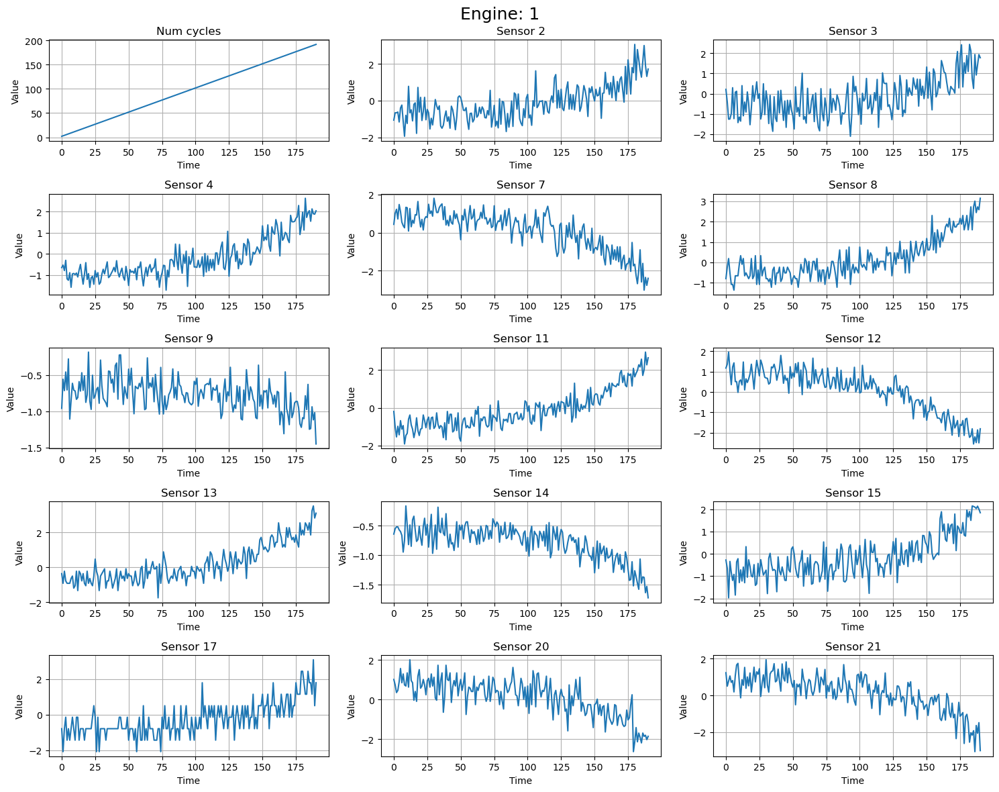

In [43]:
plot_engine_vs_sensors(df_clean, engine_number=1)

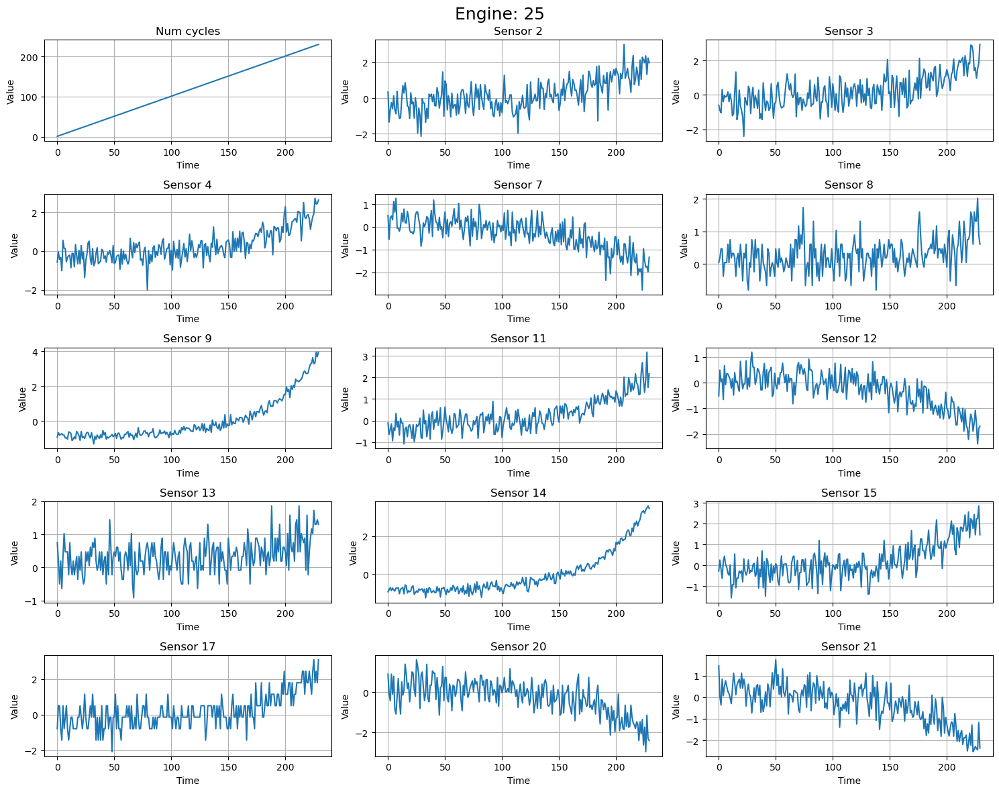

In [44]:
plot_engine_vs_sensors(df_clean, engine_number=25)

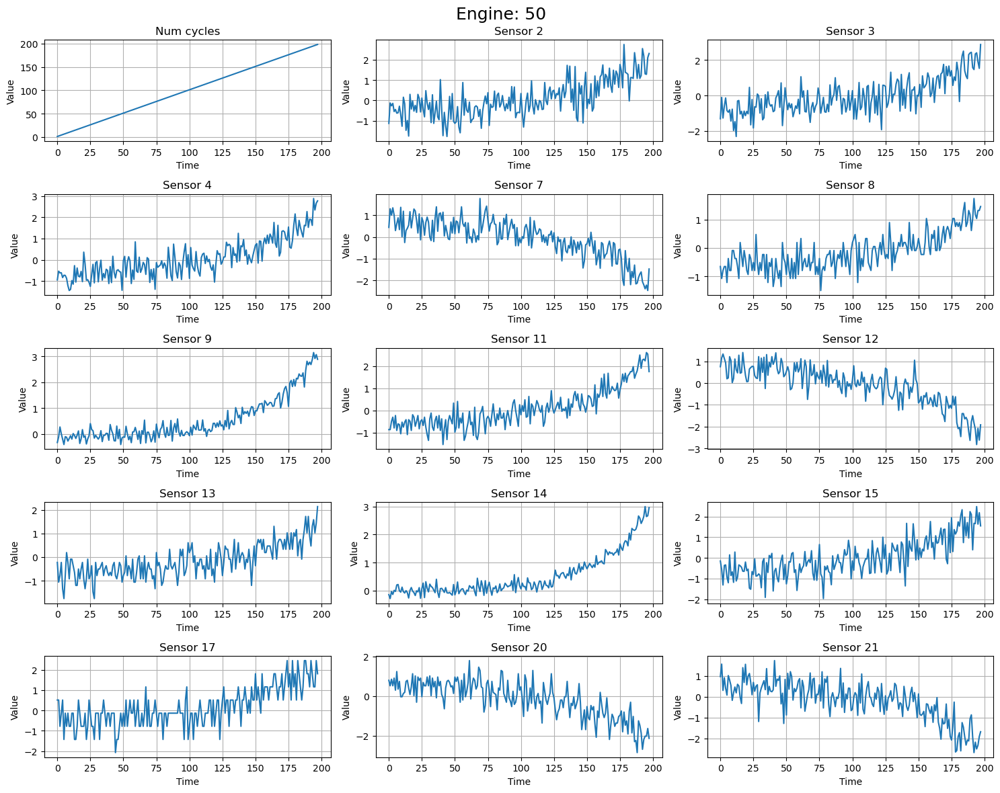

In [45]:
plot_engine_vs_sensors(df_clean, engine_number=50)

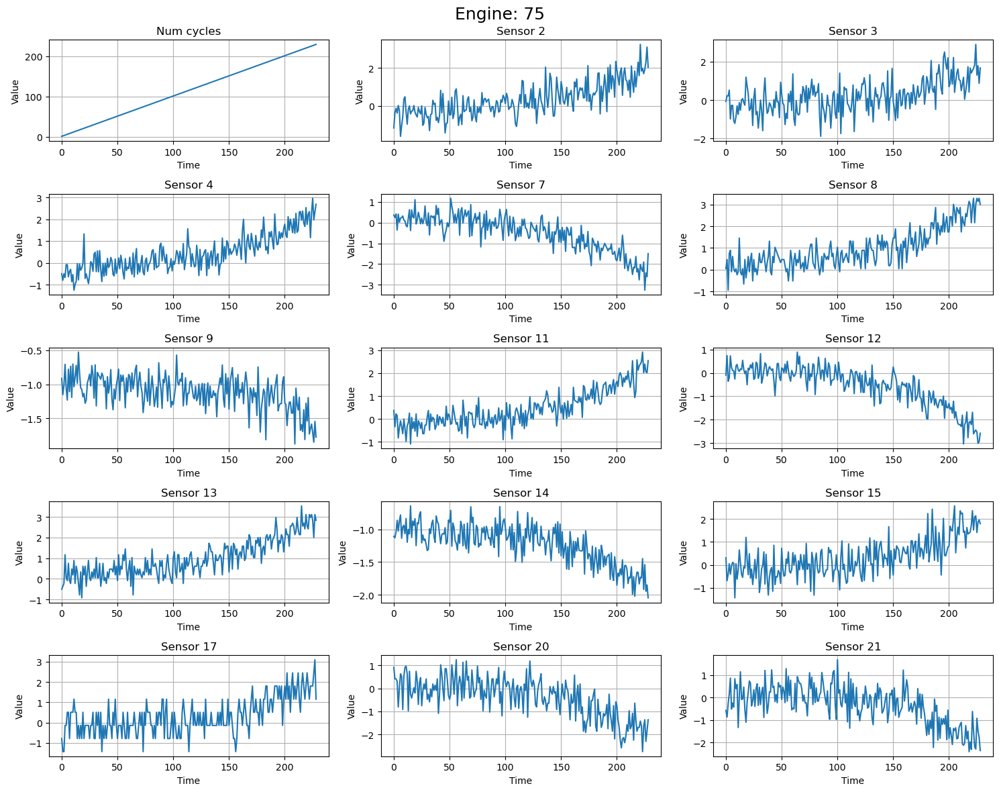

In [46]:
plot_engine_vs_sensors(df_clean, engine_number=75)

Looks like some of the sensors are noisy, with their value's changeing in quick succession. We will apply smoothing to 'de-noise' the sensor measurements.

In [53]:
# Smoothing and denoising
df_clean_smooth = df_clean.copy()  # new varaible (for tuning the window-size)

df_clean_smooth[sensor_names] = df_clean_smooth[sensor_names].rolling(
    window=5,
    center=True,
    min_periods=1
).mean()

df_clean_smooth.describe()

,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 8,Sensor 9,Sensor 11,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 17,Sensor 20,Sensor 21
count,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,2.063000e+04,20630.000000,20630.000000,20630.000000
mean,51.509016,108.813088,-0.000004,-0.000012,-0.000004,0.000009,0.000006,0.000005,-0.000019,0.000016,-0.000003,0.000003,-5.643715e-07,0.000013,-0.000004,-0.000011
std,29.226226,68.878570,0.824052,0.795361,0.896121,0.892783,0.907080,0.964352,0.919767,0.911752,0.907445,0.969154,8.593967e-01,0.817772,0.846794,0.849537
min,1.000000,1.000000,-2.129877,-2.328954,-2.072813,-2.897334,-2.009627,-1.702339,-1.921365,-2.968550,-2.087909,-2.111903,-2.003127e+00,-2.073113,-2.712532,-2.570960
25%,26.000000,52.000000,-0.609929,-0.579526,-0.678378,-0.526134,-0.685404,-0.513636,-0.693301,-0.544312,-0.669607,-0.544081,-6.544960e-01,-0.652603,-0.521521,-0.510767
50%,52.000000,104.000000,-0.085948,-0.099518,-0.106016,0.077211,-0.037380,-0.219127,-0.086757,0.073950,-0.029980,-0.167852,-9.323309e-02,-0.136054,0.087094,0.084814
75%,77.000000,156.000000,0.510032,0.474111,0.552287,0.682816,0.554294,0.159137,0.557228,0.697635,0.526217,0.225257,5.181568e-01,0.509632,0.629313,0.633697
max,100.000000,362.000000,2.677957,2.861918,2.672078,2.040908,3.230915,7.182170,2.743782,2.110418,3.362822,7.202663,2.673620e+00,2.834102,2.045725,2.008930


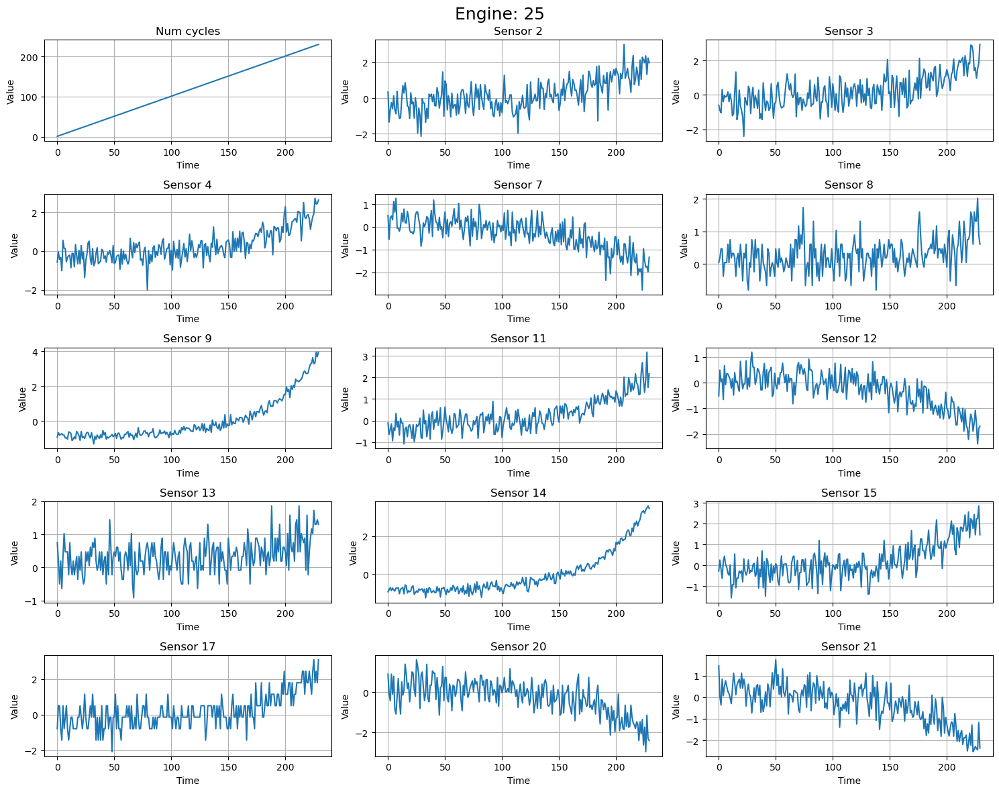

In [51]:
# Checking the plots again
# BEFORE (Engine-25)
plot_engine_vs_sensors(df_clean, engine_number=25)

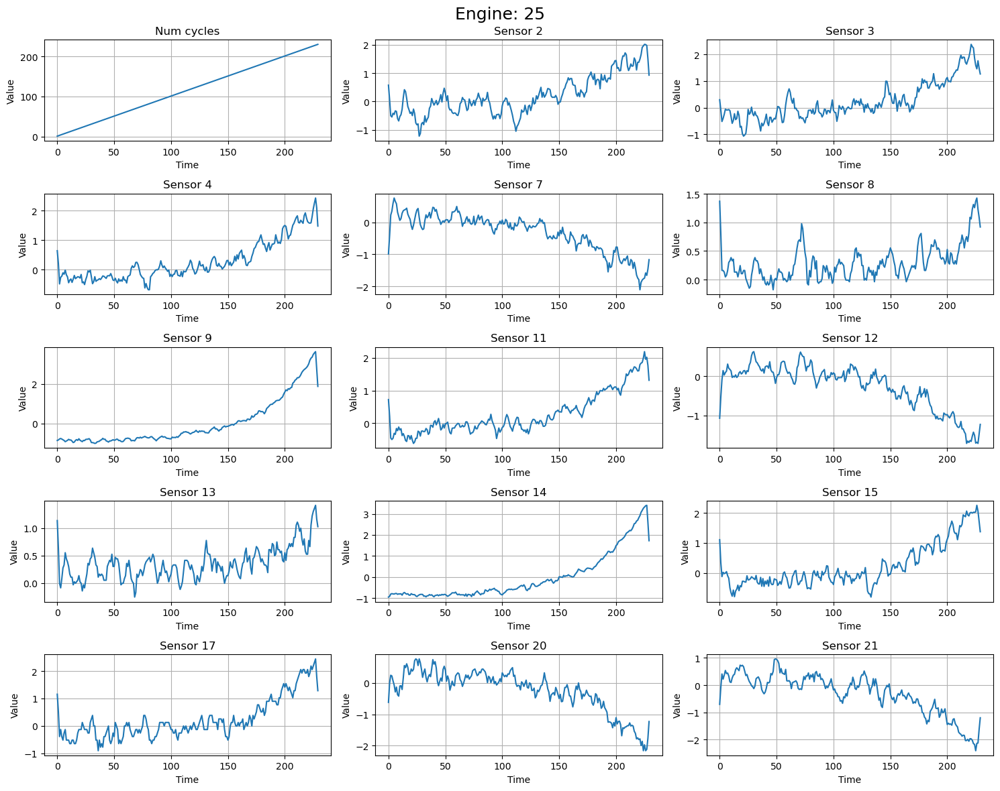

In [54]:
# AFTER (Engine-25)
plot_engine_vs_sensors(df_clean_smooth, engine_number=25)

These plots are much smoother. Looks like a window size of 5 is good and doesn't more tuning.

In [55]:
# Smoothing is done, we can delete the temp var
df_clean = df_clean_smooth
del df_clean_smooth

In [56]:
df_clean.describe()

,Engine no,Num cycles,Sensor 2,Sensor 3,Sensor 4,Sensor 7,Sensor 8,Sensor 9,Sensor 11,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 17,Sensor 20,Sensor 21
count,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,20630.000000,2.063000e+04,20630.000000,20630.000000,20630.000000
mean,51.509016,108.813088,-0.000004,-0.000012,-0.000004,0.000009,0.000006,0.000005,-0.000019,0.000016,-0.000003,0.000003,-5.643715e-07,0.000013,-0.000004,-0.000011
std,29.226226,68.878570,0.824052,0.795361,0.896121,0.892783,0.907080,0.964352,0.919767,0.911752,0.907445,0.969154,8.593967e-01,0.817772,0.846794,0.849537
min,1.000000,1.000000,-2.129877,-2.328954,-2.072813,-2.897334,-2.009627,-1.702339,-1.921365,-2.968550,-2.087909,-2.111903,-2.003127e+00,-2.073113,-2.712532,-2.570960
25%,26.000000,52.000000,-0.609929,-0.579526,-0.678378,-0.526134,-0.685404,-0.513636,-0.693301,-0.544312,-0.669607,-0.544081,-6.544960e-01,-0.652603,-0.521521,-0.510767
50%,52.000000,104.000000,-0.085948,-0.099518,-0.106016,0.077211,-0.037380,-0.219127,-0.086757,0.073950,-0.029980,-0.167852,-9.323309e-02,-0.136054,0.087094,0.084814
75%,77.000000,156.000000,0.510032,0.474111,0.552287,0.682816,0.554294,0.159137,0.557228,0.697635,0.526217,0.225257,5.181568e-01,0.509632,0.629313,0.633697
max,100.000000,362.000000,2.677957,2.861918,2.672078,2.040908,3.230915,7.182170,2.743782,2.110418,3.362822,7.202663,2.673620e+00,2.834102,2.045725,2.008930


# Data exploration and vis

1. PCA
2. t-SNE
3. Histograms of principal components
4. Analyse plots and look for trends

Try to understand if seprabale structures exist before clustering.

In [60]:
X = df_clean[sensor_names].to_numpy()
X.shape, type(X)

((20630, 14), numpy.ndarray)

We will perform PCA in both: 2D and 3D. This will help us find some "hidden" insights from the dataset.

## PCA

In [62]:
import numpy as np
from sklearn.decomposition import PCA

# 2D
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X)

# 3D
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X)

X_pca_2d.shape, X_pca_3d.shape  # Verify shapes (n_samples, 2/3)

((20630, 2), (20630, 3))

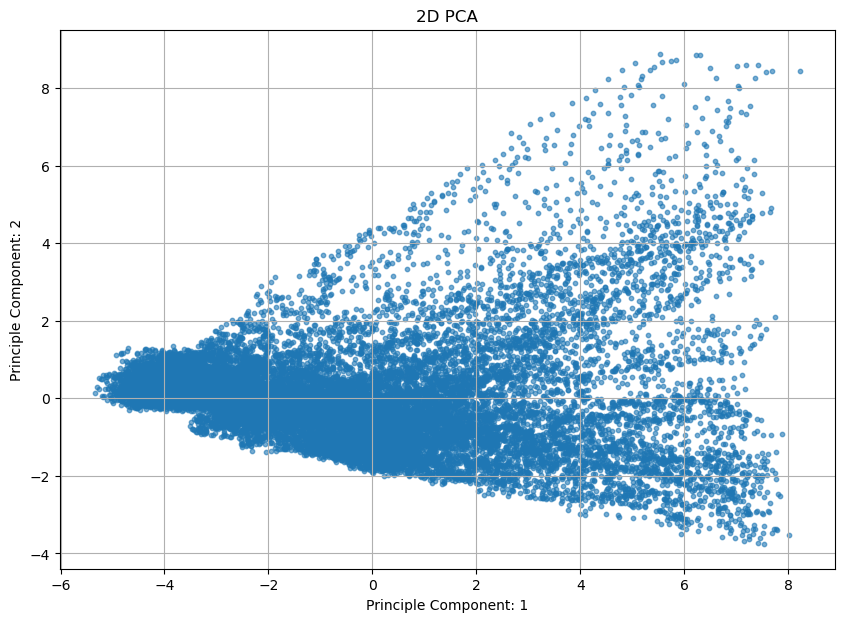

In [63]:
# 2D PCA plot
plt.figure(figsize=(10, 7))
plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], s=10, alpha=0.6)
plt.xlabel("Principle Component: 1")
plt.ylabel("Principle Component: 2")
plt.title("2D PCA")
plt.grid(True)
plt.show();

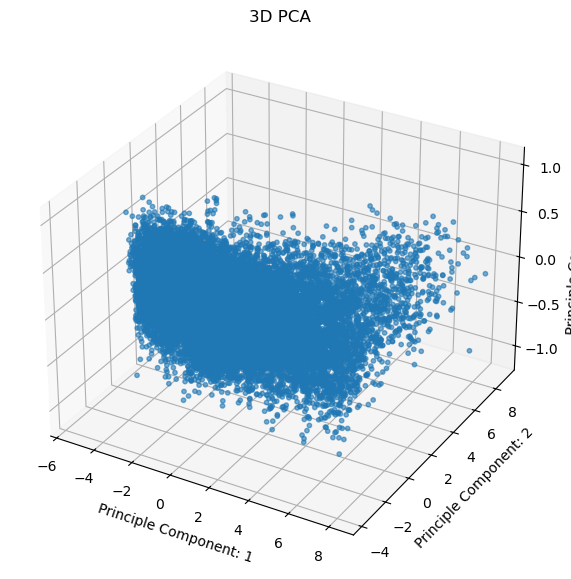

In [79]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 7))
ax= fig.add_subplot(111, projection="3d")
ax.scatter(X_pca_3d[:, 0], X_pca_3d[:, 1], X_pca_3d[:, 2], s=10, alpha=0.6)

ax.set_xlabel("Principle Component: 1")
ax.set_ylabel("Principle Component: 2")
ax.set_zlabel("Principle Component: 3")
ax.set_title("3D PCA")
plt.show();


In [77]:
# Creating an interactive 3D plot (allows us to rotate it and all)
import plotly.express as px
df_pca_3d = pd.DataFrame(X_pca_3d, columns=["PC1", "PC2", "PC3"])

fig = px.scatter_3d(df_pca_3d,
                    x="PC1",
                    y="PC2",
                    z="PC3",
                    title="3D PCA (interactive)",
                    opacity=0.5,)
fig.show();

**Key-takeaway**:\
It's hard to find definitive clusters from the graphs above. This suggests that the data may not be linearly separable (PCA assumption). Therefore, we can try to plot using t-SNE [1].

**References**:\
[1] L. van der Maaten and G. Hinton, “Visualizing data using t-SNE,” Journal of Machine Learning Research, vol. 9, no. Nov, pp. 2579–2605, 2008.

## t-SNE

In [90]:
%%timeit
from sklearn.manifold import TSNE

global_perplexity = 20  # Hyper-param for tuning (for both 2d and 3d t-SNE)
X =  df_clean[sensor_names].to_numpy()  # Data

# 2D
tsne_2d = TSNE(
    n_components=2,
    perplexity=global_perplexity,
    learning_rate=200,
    random_state=42
)
X_tsne_2d = tsne_2d.fit_transform(X)

# 3D
tsne_3d = TSNE(
    n_components=3,
    perplexity=global_perplexity,
    learning_rate=200,
    random_state=42
)
X_tsne_3d = tsne_3d.fit_transform(X)

X_tsne_2d.shape, X_tsne_3d.shape

CPU times: user 15min 11s, sys: 2min 7s, total: 17min 19s
Wall time: 1min 43s


((20630, 2), (20630, 3))

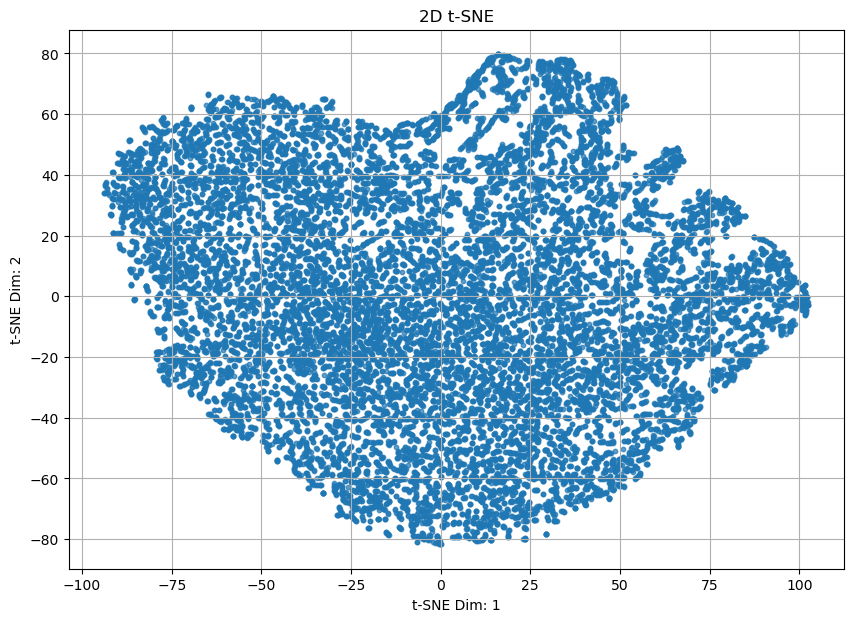

In [91]:
# 2D plot
plt.figure(figsize=(10, 7))
plt.scatter(X_tsne_2d[:, 0], X_tsne_2d[:, 1], s=10, alpha=0.7)
plt.title("2D t-SNE")
plt.xlabel("t-SNE Dim: 1")
plt.ylabel("t-SNE Dim: 2")
plt.grid(True)
plt.show();

In [92]:
df_tsne_3d = pd.DataFrame(X_tsne_3d, columns=["Dim1", "Dim2", "Dim3"])
fig = px.scatter_3d(df_tsne_3d,
                    x="Dim1",
                    y="Dim2",
                    z="Dim3",
                    title="3D t-SNE (interactive)",
                    opacity=0.1)
fig.show()

## Analyze PCA-Projected Data
- Histogram of Principle Components
- Pair-plot of the PCA components
- Explained variance ratio
- Box plots of PC1-PC3
- Density plots
- Corr-mat of PCA Components
- Projection trend per engine


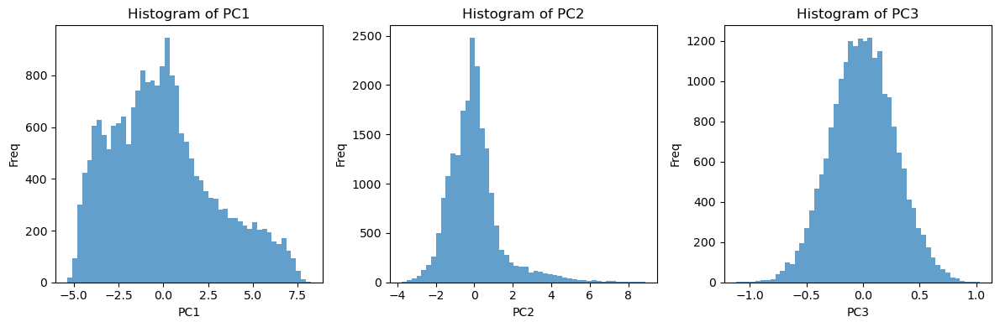

In [95]:
# Histogram of PC's
plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.hist(X_pca_3d[:, i], bins=50, alpha=0.7)
    plt.title(f"Histogram of PC{i+1}")
    plt.xlabel(f"PC{i+1}")
    plt.ylabel("Freq")
plt.tight_layout()
plt.show();

**Takeaway**: **PC1** seems to have the strongest potential signal of degradation. Its skewed left with a long tail on the right, this may capture degradation; early engines on the left, with worse ones on the right. **PC2** is sharply peaked and asymmetric, this probably explains fine-grained variation. **PC3** is Gaussian, this is mostly just noise and/or some residual structure.

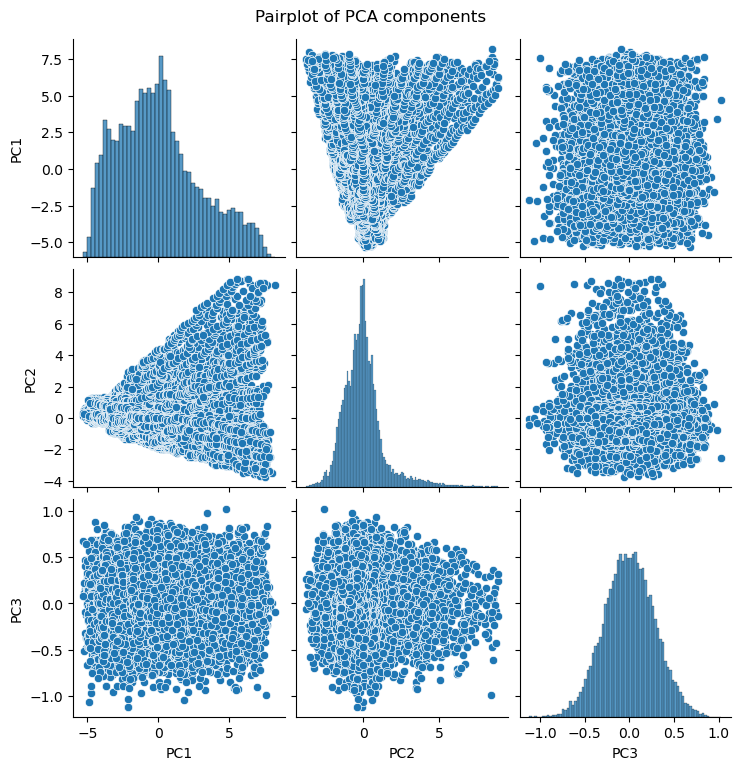

In [100]:
# Pairplot of PCA components
import seaborn as sns
pca_3d_df = pd.DataFrame(X_pca_3d[:, :3], columns=[f"PC{i+1}" for i in range(3)])
sns.pairplot(pca_3d_df)
plt.suptitle("Pairplot of PCA components", y=1.02)
plt.show();

**Takeaway**: The plot **PC1 vs PC2** depicts some structure from its cone-like shape, these exists some 'directionality' (which could be degradation). The rest of the plots are less structured, thus less valueable for us.

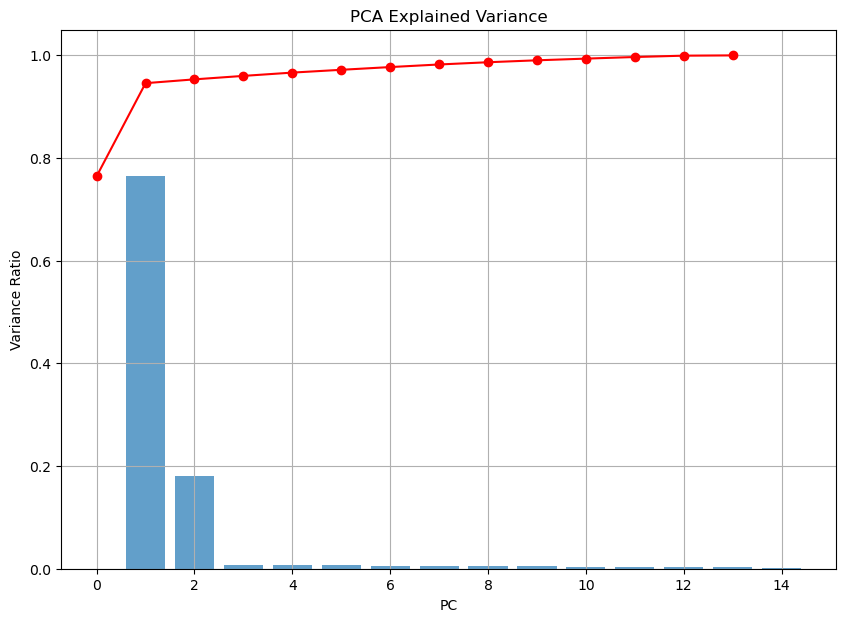

In [101]:
# Explained variance ratio
pca_full = PCA()
pca_full.fit(X)
explained_var = pca_full.explained_variance_ratio_

plt.figure(figsize=(10, 7))
plt.bar(range(1, len(explained_var)+1), explained_var, alpha=0.7)
plt.plot(np.cumsum(explained_var), marker="o", color="red")
plt.title("PCA Explained Variance")
plt.xlabel("PC")
plt.ylabel("Variance Ratio")
plt.grid(True)
plt.show();

**Takeaway**: **PC1** captures $\approx 75 %$ and **PC1 + PC2** captures $\approx 95 %$. The remaining are (nearly) nill. This means that we can work with PC1 (or) PC1 + PC2 for clustering and stage-classification.

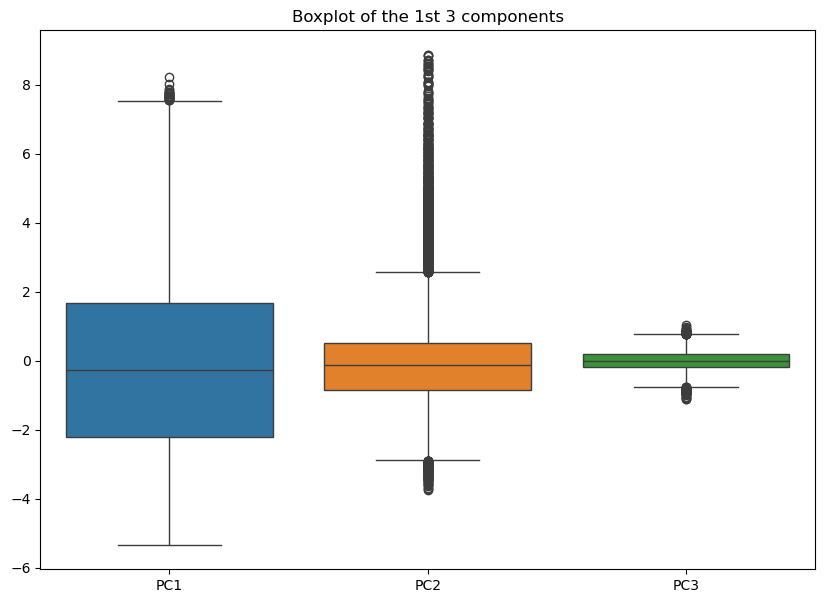

In [105]:
# Box plots of PC1-PC3
plt.figure(figsize=(10, 7))
sns.boxplot(data=pca_3d_df.iloc[:, :3])
plt.title("Boxplot of the 1st 3 components")
plt.show();

**Takeaway**: PC1 and PC2 have lots of outliers, this is not a bad thing (not Gaussian i.e. there may be clusters). PC3 is the opposite, very little outliers and likely Gaussian (verified from Histogram above).

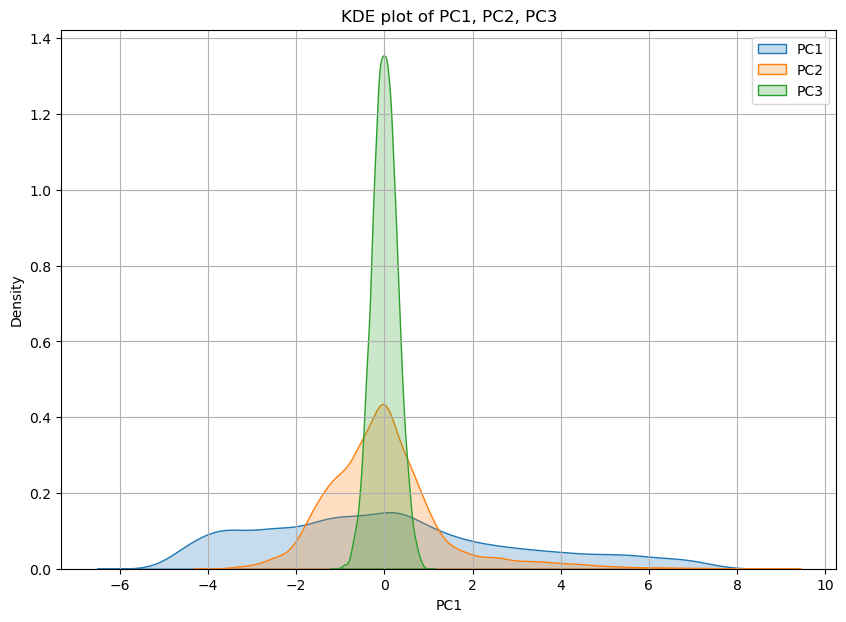

In [109]:
# Density plot(s)
plt.figure(figsize=(10, 7))
sns.kdeplot(pca_3d_df["PC1"], fill=True, label="PC1")
sns.kdeplot(pca_3d_df["PC2"], fill=True, label="PC2")
sns.kdeplot(pca_3d_df["PC3"], fill=True, label="PC3")
plt.title("KDE plot of PC1, PC2, PC3")
plt.legend()
plt.grid(True)
plt.show();

**Takeaway**: Looks good, may get stage like clusters when using PC1 (exclusively).

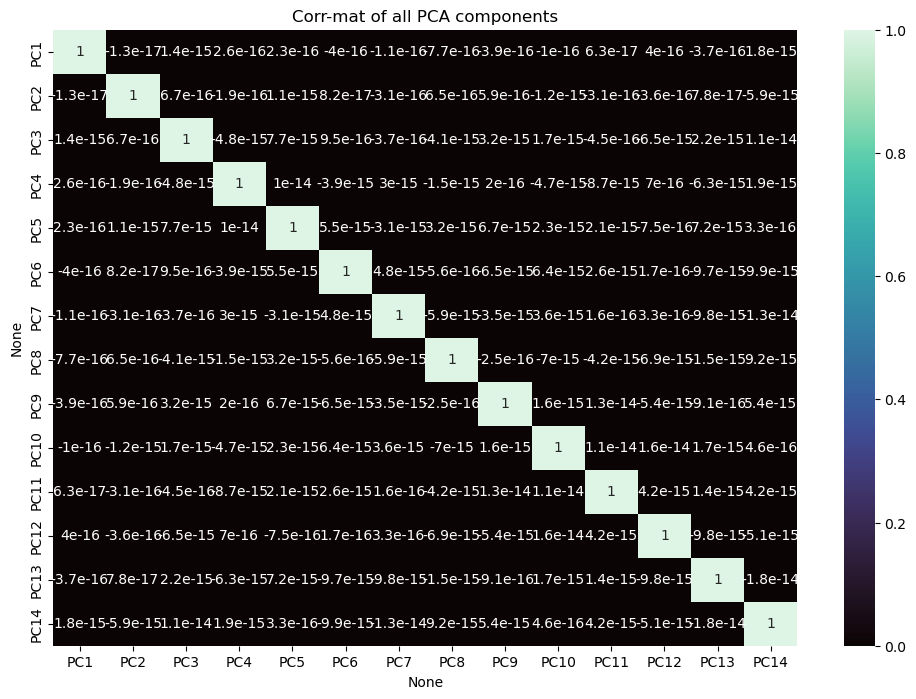

In [118]:
# Corr-mat of PCA components
pca_df = pca_full.transform(X)
pca_df = pd.DataFrame(data=pca_df, columns=[[f"PC{i+1}" for i in range(pca_df.shape[-1])]])

plt.figure(figsize=(12, 8))
sns.heatmap(pca_df.corr(), annot=True, cmap="mako")
plt.title("Corr-mat of all PCA components")
plt.show();

**Takeaway**: Nice, we want this. Any corr b/w the PC's is not a good thing. So this is nice.

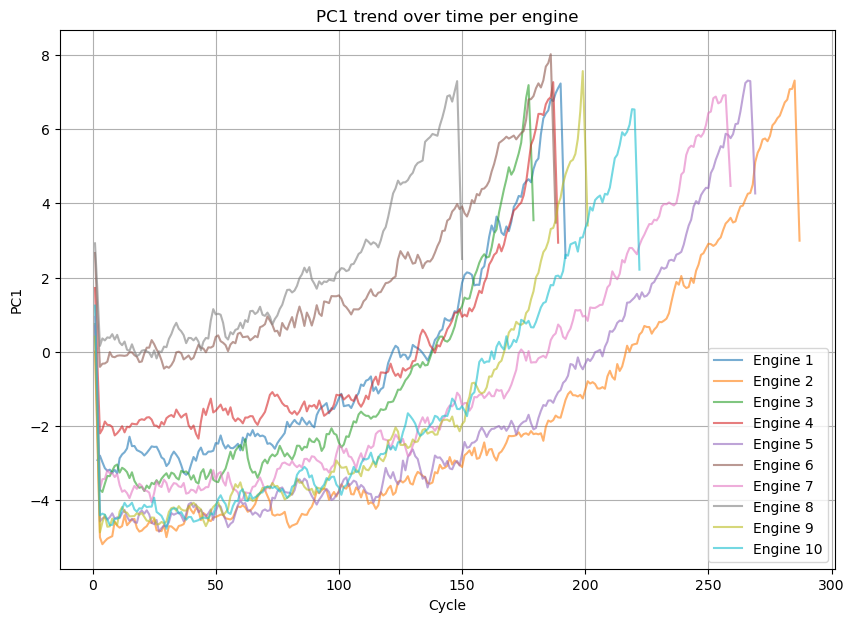

In [119]:
# Projection trend per engine
plt.figure(figsize=(10, 7))
for engine in df_clean["Engine no"].unique()[:10]:  # 1st 10 engines ONLY
    ids = df_clean["Engine no"] == engine
    plt.plot(df_clean.loc[ids, "Num cycles"], X_pca_3d[ids, 0], alpha=0.6, label=f"Engine {engine}")
plt.title("PC1 trend over time per engine")
plt.xlabel("Cycle")
plt.ylabel("PC1")
plt.legend()
plt.grid(True)
plt.show();

**Takeaway**: PC1 is increasing with a similar trend and peak over multiple engines. There exists some sharp inflection points, this aligns with whats expected from degradation/failure. This tells us that a lower PC1 -> good engine, higher PC1 -> bad/failing engine.

**VERY IMPORTANT INSIGHT**

## Final thoughts
Looks like PC1 is the best bet for clustering and classifying engines into their stage(s). PC1 + PC2 is also another contender. So its best if we test out both for clustering, then compare and constrast the outcomes to choose the best model.

---

Some other insight also suggests that: as the engine-cycle count increases, then, PC1 also increases with similar peaks. This is very important as this tells us that PC1 can explain this engine degradation very well.

# Clustering

1. K-Means (k=5) assuming cluster per stage
2. Agglomerative (n=5)
3. Plot clustering and analyse
4. Check cluster distributions for hyper-param tuning

We will be running 4 experiments:
|S.no|Model-name|Clustering Algorithm|Data|n/k|
|-|-|-|-|-|
|1|model_1|KMeans|PC1|5|
|2|model_2|KMeans|PC1 + PC2|5|
|3|model_3|Agglomerative|PC1|5|
|4|model_4|Agglomerative|PC1 + PC2|5|

In [128]:
# Preping the data and hyper-params for clustering
X_pc1 = X_pca_3d[:, 0].reshape(-1, 1)
X_pc12 = X_pca_3d[:, :2]

k = 5  # 'K' in KMeans and the number of clusters in Agglomerative

X_pc1.shape, X_pc12.shape, k

((20630, 1), (20630, 2), 5)

In [131]:
from sklearn.cluster import KMeans, AgglomerativeClustering

# All models
model_1 = KMeans(n_clusters=k, random_state=42).fit(X_pc1)
model_2 = KMeans(n_clusters=k, random_state=42).fit(X_pc12)
model_3 = AgglomerativeClustering(n_clusters=k).fit(X_pc1)
model_4 = AgglomerativeClustering(n_clusters=k).fit(X_pc12)

# All model label-preds
labels_1 = model_1.labels_
labels_2 = model_2.labels_
labels_3 = model_3.labels_
labels_4 = model_4.labels_

labels_1.shape, labels_2.shape, labels_3.shape, labels_4.shape

((20630,), (20630,), (20630,), (20630,))

In [178]:
# Creating a mapping from model-pred label to stage-label
def map_label_pc1(cluster_labels, pc1_values):
    cluster_ids = np.unique(cluster_labels)
    means = [np.mean(pc1_values[cluster_labels == c_id]) for c_id in cluster_ids]
    sorted_clusters = np.argsort(means)
    mapping = {cluster_id: stage for stage, cluster_id in enumerate(sorted_clusters)}
    return np.array([mapping[c_id] for c_id in cluster_labels])

stage_model_1 = map_label_pc1(labels_1, X_pc1.flatten())
stage_model_2 = map_label_pc1(labels_2, X_pc1.flatten())
stage_model_3 = map_label_pc1(labels_3, X_pc1.flatten())
stage_model_4 = map_label_pc1(labels_4, X_pc1.flatten())

stage_model_1.shape, stage_model_2.shape, stage_model_3.shape, stage_model_4.shape

((20630,), (20630,), (20630,), (20630,))

# Cluster interpretation
This is where we start to assign a stage to each of the clusters

1. Find a way to rank the clusters based on how bad the engine is

In [165]:
# Compare the clustering(s)
from sklearn.metrics import adjusted_rand_score
print(f"Model-1 vs Model-2: {adjusted_rand_score(stage_model_1, stage_model_2):.5f}")
print(f"Model-3 vs Model-4: {adjusted_rand_score(stage_model_3, stage_model_4):.5f}")
print(f"Model-1 vs Model-3: {adjusted_rand_score(stage_model_1, stage_model_3):.5f}")
print(f"Model-2 vs Model-4: {adjusted_rand_score(stage_model_2, stage_model_4):.5f}")

Model-1 vs Model-2: 0.65855
Model-3 vs Model-4: 0.52279
Model-1 vs Model-3: 0.76194
Model-2 vs Model-4: 0.39213


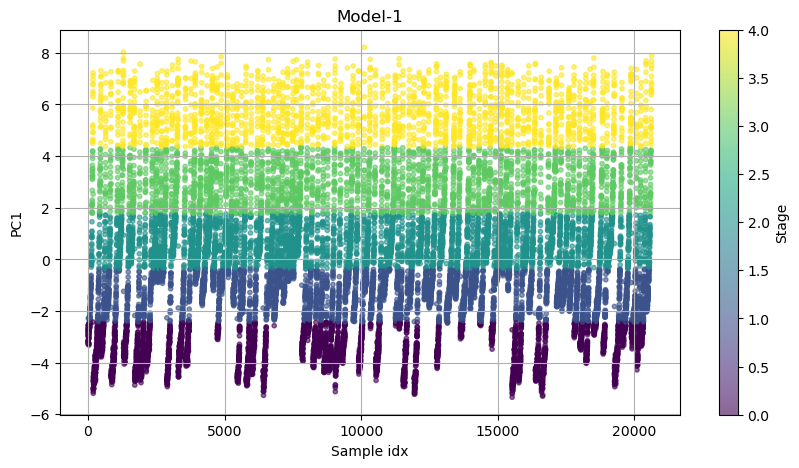

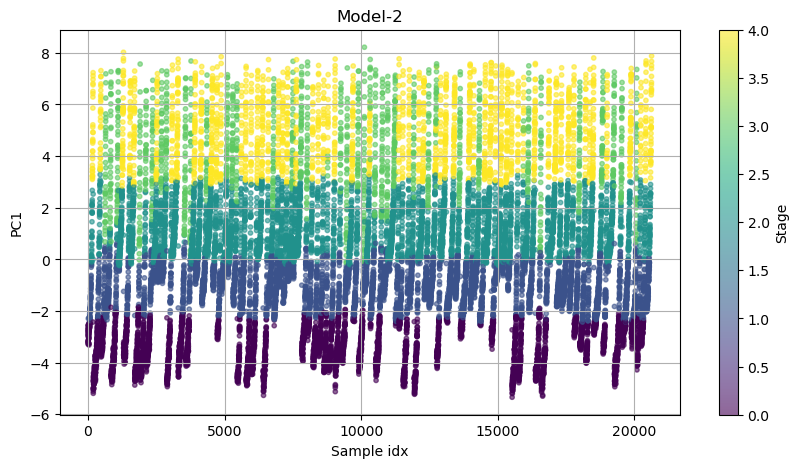

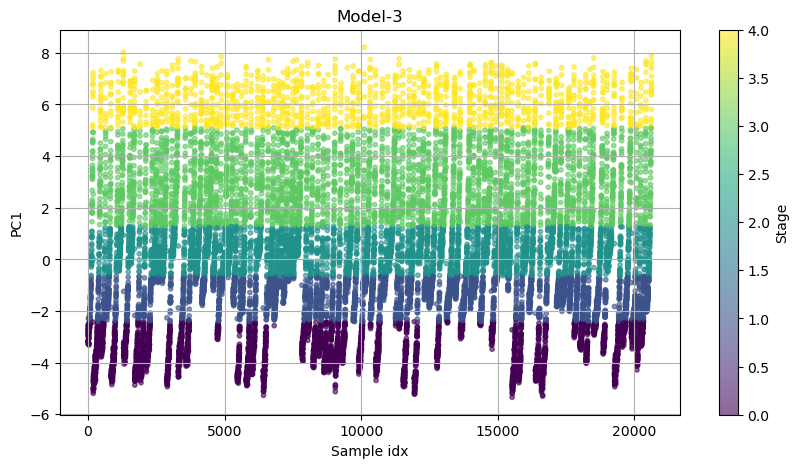

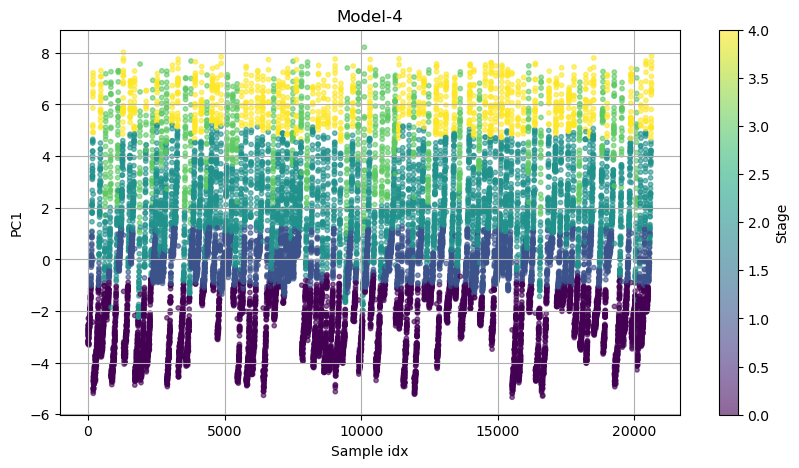

In [166]:
# Viz the spread
def plot_stages(pc1, stage_labels, title):
    plt.figure(figsize=(10, 5))
    plt.scatter(range(len(pc1)), pc1, c=stage_labels, cmap="viridis", s=10, alpha=0.6)
    plt.title(title)
    plt.xlabel("Sample idx")
    plt.ylabel("PC1")
    plt.colorbar(label="Stage")
    plt.grid(True)
    plt.show()

plot_stages(X_pc1.flatten(), stage_model_1, "Model-1")
plot_stages(X_pc1.flatten(), stage_model_2, "Model-2")
plot_stages(X_pc1.flatten(), stage_model_3, "Model-3")
plot_stages(X_pc1.flatten(), stage_model_4, "Model-4")

We will chose Model-1 (KMeans with PC1). This model demonstrates a clean distiction b/w classes (stages) with near to no overlap b/w classes. And we also see that the stage predicted follows the trend seen during the Engine-cycle vs PC1 graph eariler.

---

There is a key decision to be made, Models 1 and 3 perform equally as good as the other. So we need to choose between one. So... given the simplicity and speed of KMeans, we will use Model-1. But if we want more interpretable merging (and generalization) we could go for Model-3.

For the task given, KMeans works.

# Verification
Compare the model-preds with engine-cycle. If the predictions indicate that the engine is in a worse stage as the cycle count increases (using just the sensor data), then its doing a great job in predicting the right stages for an engine.

In [191]:
# New mapping function (creates a generalized mapping - dict)
def get_cluster_to_stage_map(cluster_labels, pc1_values):
    cluster_ids = np.unique(cluster_labels)
    cluster_means = {
        c_id: np.mean(pc1_values[cluster_labels == c_id]) for c_id in cluster_ids
    }
    sorted_clusters = sorted(cluster_means.items(), key=lambda x: x[1])
    mapping = {cluster_id: stage for stage, (cluster_id, _) in enumerate(sorted_clusters)}
    return mapping

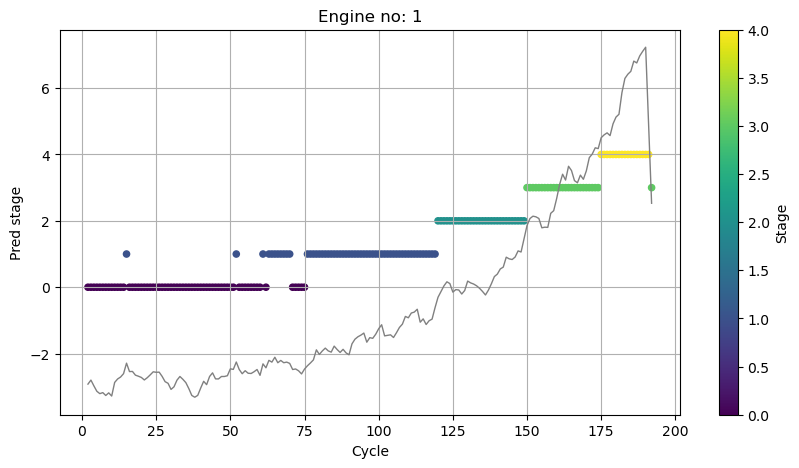

In [193]:
engine_id = 1  # Choose from the given samples
engine_df = df_clean[df_clean["Engine no"] == engine_id].copy()

# This is essentially the data pipeline before entering the model
X_engine = engine_df[sensor_names].to_numpy()
pc1_engine = pca_3d.transform(X_engine)[:, 0]

# Model prediction
preds = model_1.predict(pc1_engine.reshape(-1, 1))
stages = map_label_pc1(preds, pc1_engine)
mapping = get_cluster_to_stage_map(preds, pc1_engine)
engine_df["Stage"] = stages

# Plot the cycle-number vs stage
plt.figure(figsize=(10, 5))
plt.plot(engine_df["Num cycles"], pc1_engine, label="PC1", color="gray", linewidth=1)
plt.scatter(engine_df["Num cycles"], stages, c=stages, cmap="viridis", s=20)
plt.title(f"Engine no: {engine_id}")
plt.xlabel("Cycle")
plt.ylabel("Pred stage")
plt.grid(True)
plt.colorbar(label="Stage")
plt.show();

In [194]:
mapping

{np.int32(1): 0,
 np.int32(3): 1,
 np.int32(0): 2,
 np.int32(4): 3,
 np.int32(2): 4}

In [195]:
# Build a pipeline (for fun and its simpler/easier to use)
from sklearn.base import BaseEstimator, TransformerMixin

class Phase1Pipeline(BaseEstimator):
    def __init__(self, scaler, pca, kmeans_model, cluster_to_stage_map):
        self.scaler = scaler
        self.pca = pca
        self.model = kmeans_model
        self.mapping = cluster_to_stage_map
    
    def transform(self, X, perform_std: bool = False):
        X = self.scaler.transform(X) if perform_std else X
        pc1 = self.pca.transform(X)[:, 0].reshape(-1, 1)
        preds = self.model.predict(pc1)
        stages = np.array([self.mapping[pred] for pred in preds])
        return stages, pc1

    def predict(self, X, return_pc1: bool = False):
        stages, pc1 = self.transform(X)
        if return_pc1:
            return stages, pc1
        return stages


In [198]:
mapping = get_cluster_to_stage_map(model_1.labels_, X_pc1.flatten())
model = Phase1Pipeline(
    scaler=scaler,
    pca=pca_3d,
    kmeans_model=model_1,
    cluster_to_stage_map=mapping
)
mapping

{np.int32(1): 0,
 np.int32(3): 1,
 np.int32(0): 2,
 np.int32(4): 3,
 np.int32(2): 4}

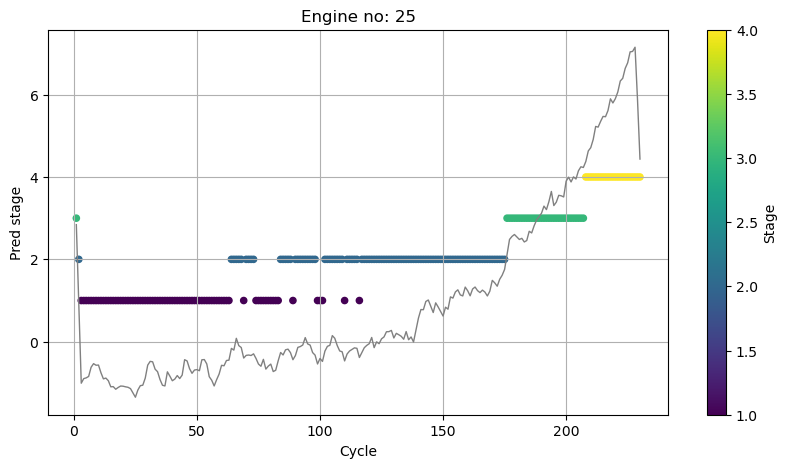

In [202]:
engine_id = 25  # Choose from the given samples
engine_df = df_clean[df_clean["Engine no"] == engine_id].copy()

# This is essentially the data pipeline before entering the model
X_engine = engine_df[sensor_names].to_numpy()
pc1_engine = pca_3d.transform(X_engine)[:, 0]

# Model prediction
preds = model_1.predict(pc1_engine.reshape(-1, 1))
stages = [mapping[pred] for pred in preds]
engine_df["Stage"] = stages

# Plot the cycle-number vs stage
plt.figure(figsize=(10, 5))
plt.plot(engine_df["Num cycles"], pc1_engine, label="PC1", color="gray", linewidth=1)
plt.scatter(engine_df["Num cycles"], stages, c=stages, cmap="viridis", s=20)
plt.title(f"Engine no: {engine_id}")
plt.xlabel("Cycle")
plt.ylabel("Pred stage")
plt.grid(True)
plt.colorbar(label="Stage")
plt.show();

In [203]:
# Verify for other engines too
def plot_cycle_vs_model_pred(engine_id, model):
    engine_df = df_clean[df_clean["Engine no"] == engine_id].copy()
    X = engine_df[sensor_names].to_numpy()
    stages, pc1 = model.predict(X, True)
    engine_df["Stage"] = stages

    plt.figure(figsize=(10, 5))
    plt.plot(engine_df["Num cycles"], pc1, label="PC1", color="gray", linewidth=1)
    plt.scatter(engine_df["Num cycles"], stages, c=stages, cmap="viridis", s=20)
    plt.title(f"Engine no: {engine_id}")
    plt.xlabel("Cycle")
    plt.ylabel("Pred stage")
    plt.grid(True)
    plt.colorbar(label="Stage")
    plt.show();

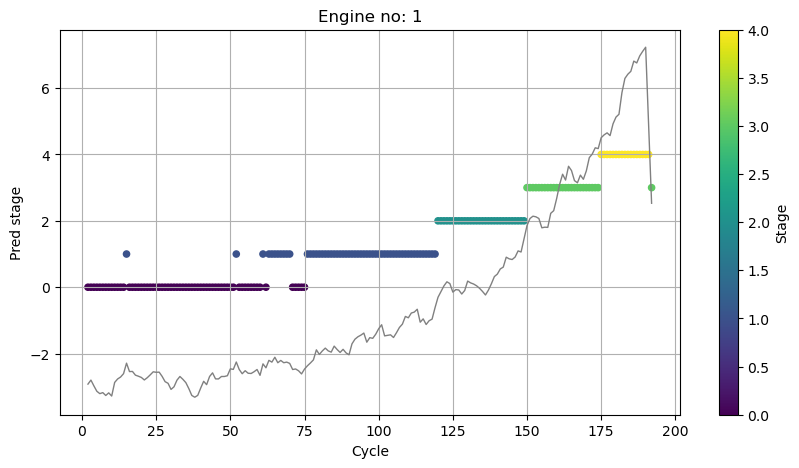

In [204]:
plot_cycle_vs_model_pred(1, model)

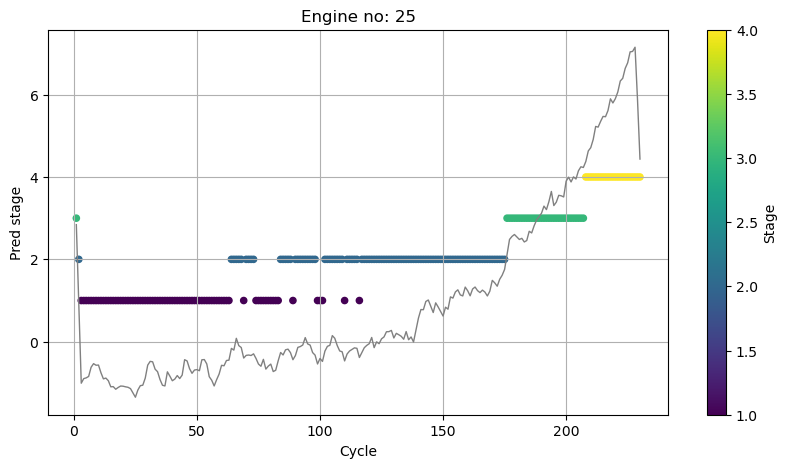

In [205]:
plot_cycle_vs_model_pred(25, model)

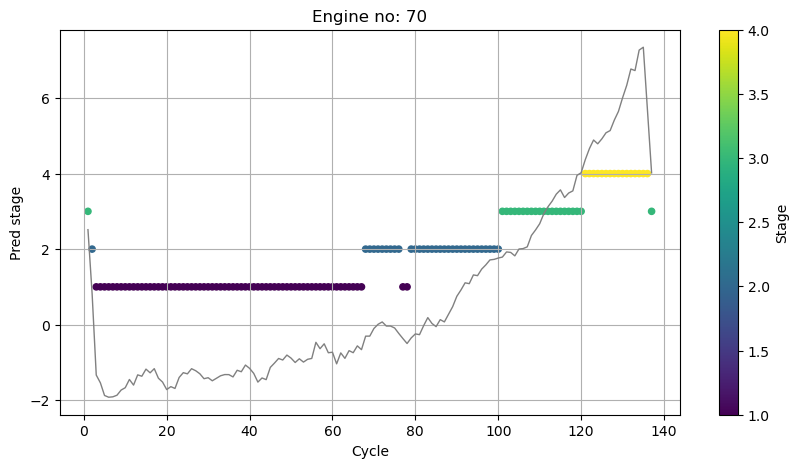

In [206]:
plot_cycle_vs_model_pred(70, model)

# Build a classifier
This is phase-2